In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import logging

from jax import random
import wandb

from src.models import make_LIVAE_loss, make_LIVAE_eval
from src.data import get_image_dataset, NumpyLoader
from src.utils.training import setup_training, train_loop
from experiments.livae_mnist_default import get_config

In [3]:
os.environ['WANDB_NOTEBOOK_NAME'] = 'train_vae.ipynb'
# ^ W&B doesn't know how to handle VS Code notebooks.

wandb.login()

wandb: Currently logged in as: jamesallingham (invariance-learners). Use `wandb login --relogin` to force relogin


True

In [4]:
# Fix for annoying "WARNING:root:The use of `check_types` is deprecated and does not have any effect."
# error message produced by tfp.
logger = logging.getLogger('root')

class CheckTypesFilter(logging.Filter):
    def filter(self, record):
        return 'check_types' not in record.getMessage()

logger.addFilter(CheckTypesFilter())

In [5]:
rng = random.PRNGKey(0)

In [6]:
config = get_config()

In [7]:
train_dataset, test_dataset, val_dataset = get_image_dataset(
    dataset_name=config.dataset_name,
    val_percent=config.val_percent,
    flatten_img=config.model.architecture == 'MLP',
)
train_loader = NumpyLoader(train_dataset, config.batch_size)
val_loader = NumpyLoader(val_dataset, config.batch_size)
test_loader = NumpyLoader(test_dataset, config.batch_size)

In [8]:
setup_rng, rng = random.split(rng)
init_data = train_dataset[0][0]

model, state = setup_training(config, setup_rng, init_data)

+------------------------------------------------+------------------+-----------+-----------+----------+
| Name                                           | Shape            | Size      | Mean      | Std      |
+------------------------------------------------+------------------+-----------+-----------+----------+
| params/dec/ConvNeXtBlock_0/dw3x3conv/bias      | (384,)           | 384       | 0.0       | 0.0      |
| params/dec/ConvNeXtBlock_0/dw3x3conv/kernel    | (7, 7, 1, 384)   | 18,816    | 0.000163  | 0.0639   |
| params/dec/ConvNeXtBlock_0/gamma               | (384,)           | 384       | 1e-06     | 1.14e-13 |
| params/dec/ConvNeXtBlock_0/norm/bias           | (384,)           | 384       | 0.0       | 0.0      |
| params/dec/ConvNeXtBlock_0/norm/scale          | (384,)           | 384       | 1.0       | 0.0      |
| params/dec/ConvNeXtBlock_0/pw1x1conv1/bias     | (1536,)          | 1,536     | 0.0       | 0.0      |
| params/dec/ConvNeXtBlock_0/pw1x1conv1/kernel   | (384

  0%|          | 0/50 [00:00<?, ?it/s]

epoch:   1 - train loss: 1.57120, val_loss: 1.50751, β: 10.0, lr: 0.00012


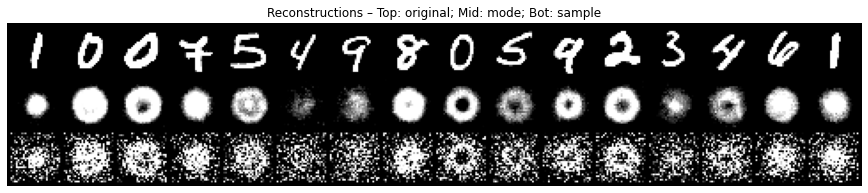

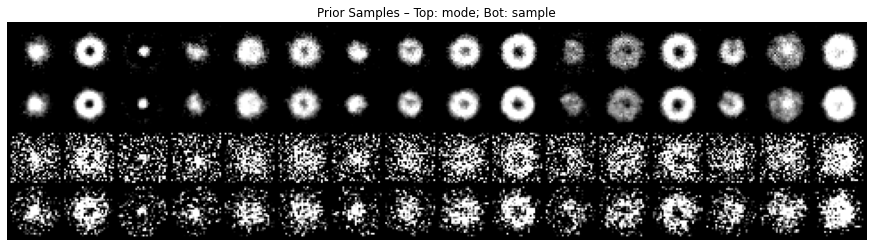

Best val_loss
epoch:   2 - train loss: 1.50225, val_loss: 1.48983, β: 10.0, lr: 0.00014


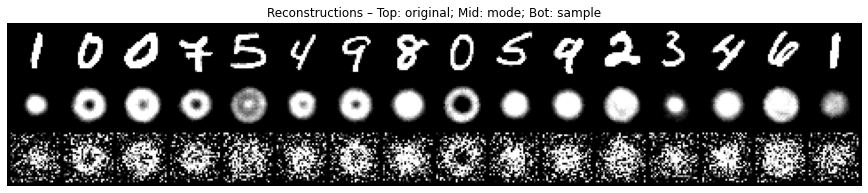

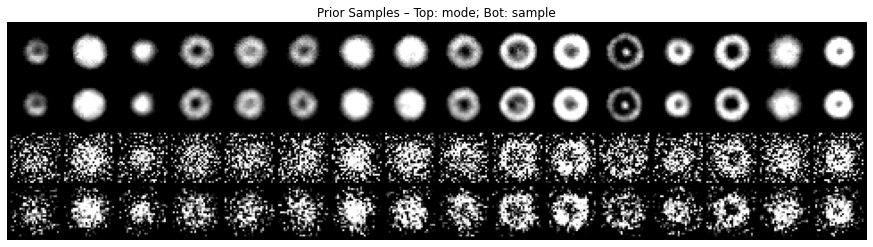

Best val_loss
epoch:   3 - train loss: 1.49152, val_loss: 1.48245, β: 9.9, lr: 0.00016


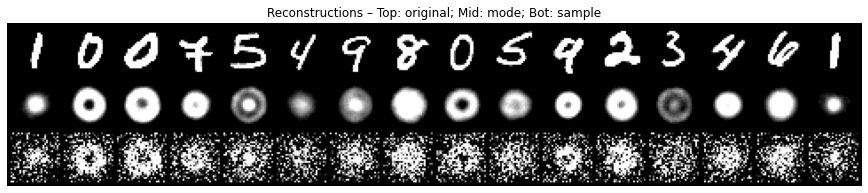

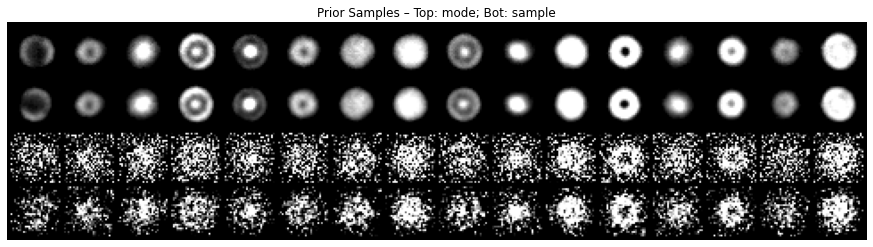

Best val_loss
epoch:   4 - train loss: 1.47780, val_loss: 1.46637, β: 9.9, lr: 0.00018


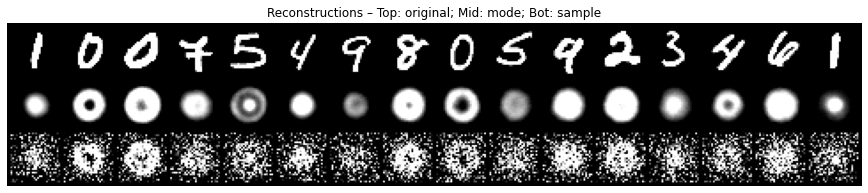

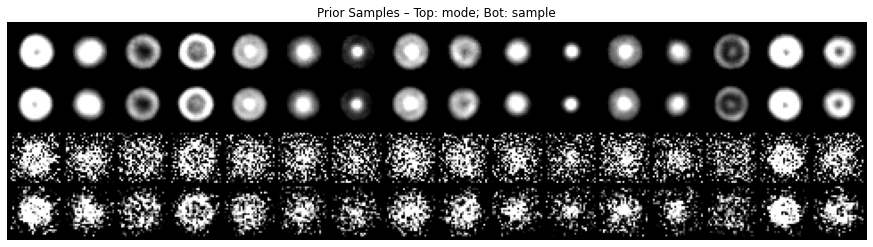

Best val_loss
epoch:   5 - train loss: 1.46793, val_loss: 1.46830, β: 9.8, lr: 0.00020


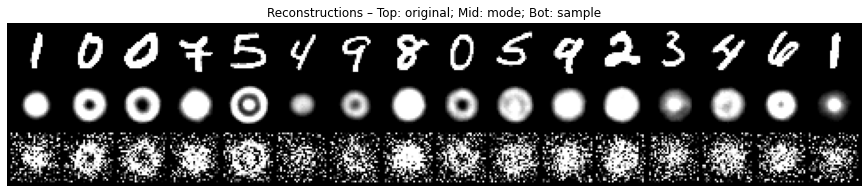

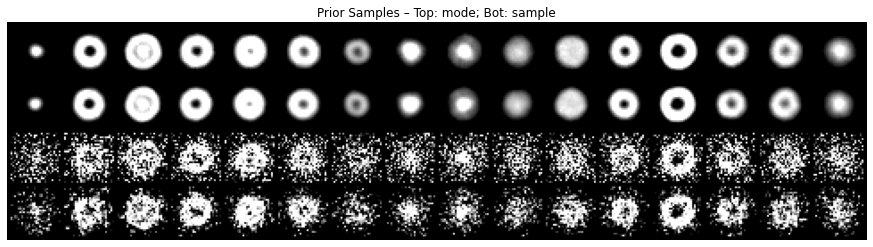

epoch:   6 - train loss: 1.45973, val_loss: 1.45537, β: 9.8, lr: 0.00022


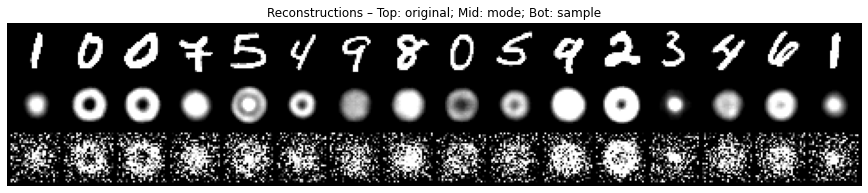

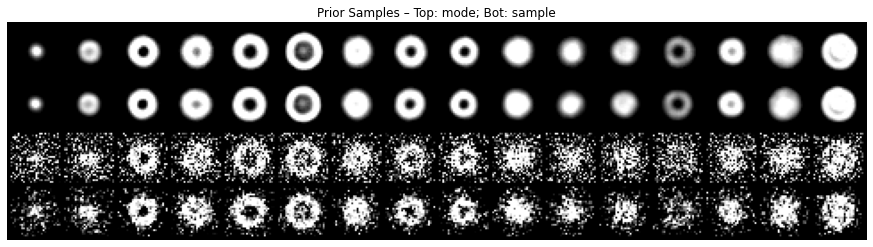

Best val_loss
epoch:   7 - train loss: 1.44564, val_loss: 1.44005, β: 9.7, lr: 0.00024


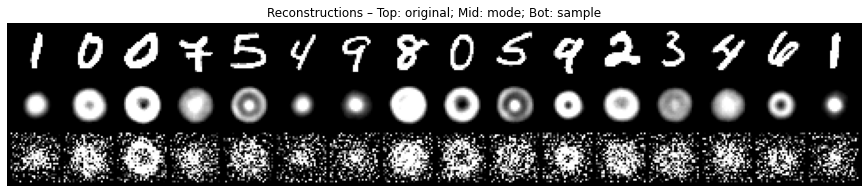

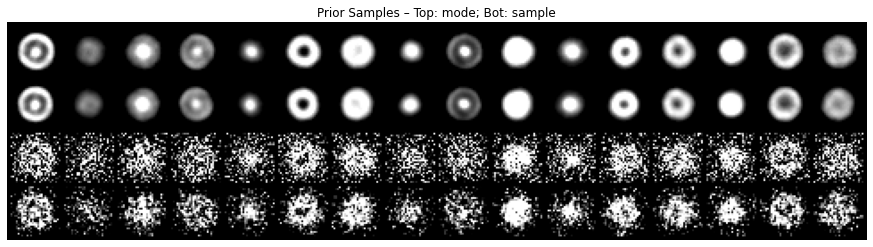

Best val_loss
epoch:   8 - train loss: 1.43610, val_loss: 1.42938, β: 9.6, lr: 0.00026


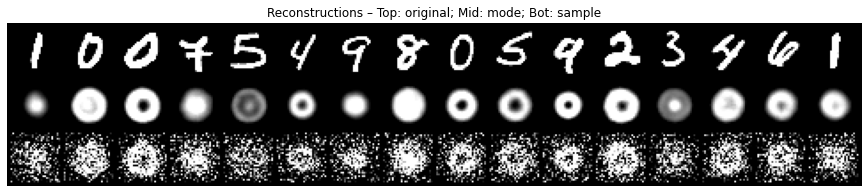

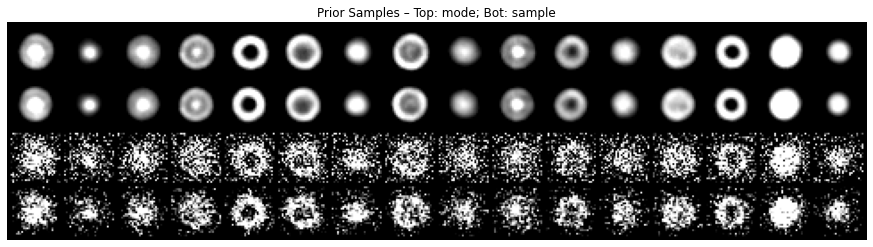

Best val_loss
epoch:   9 - train loss: 1.42698, val_loss: 1.42268, β: 9.5, lr: 0.00028


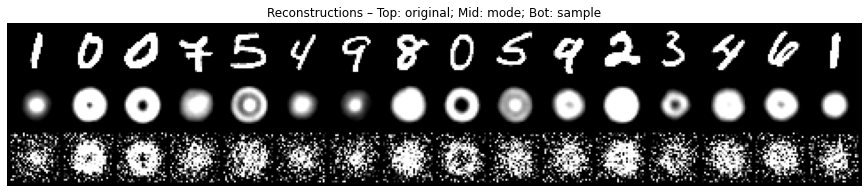

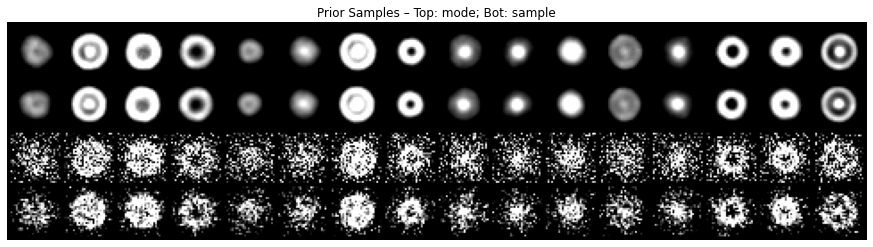

Best val_loss
epoch:  10 - train loss: 1.41775, val_loss: 1.41052, β: 9.3, lr: 0.00030


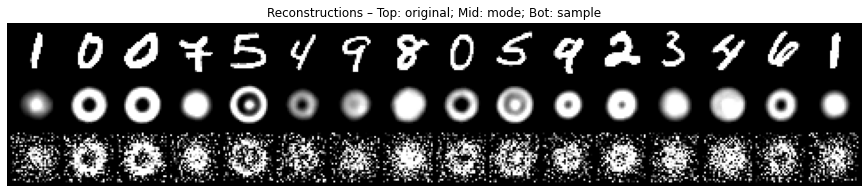

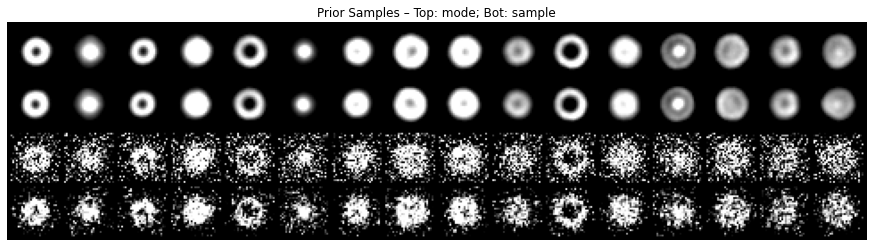

Best val_loss
epoch:  11 - train loss: 1.40505, val_loss: 1.39944, β: 9.2, lr: 0.00030


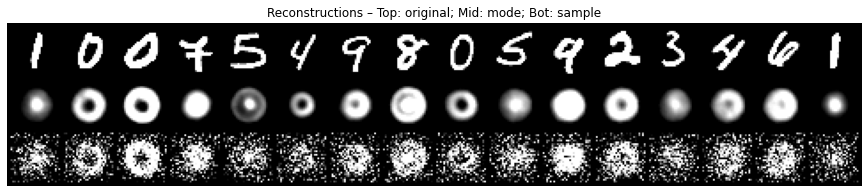

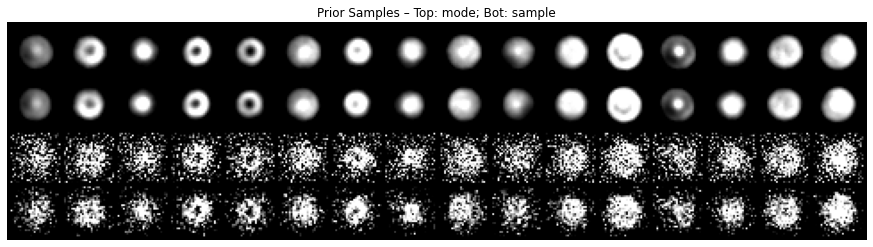

Best val_loss
epoch:  12 - train loss: 1.39579, val_loss: 1.38989, β: 9.1, lr: 0.00030


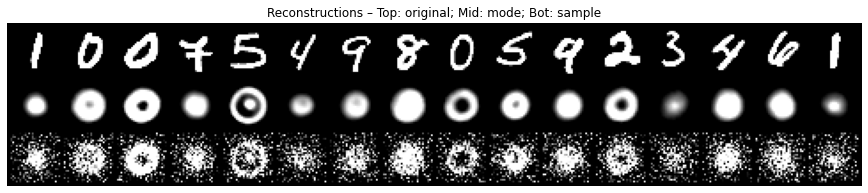

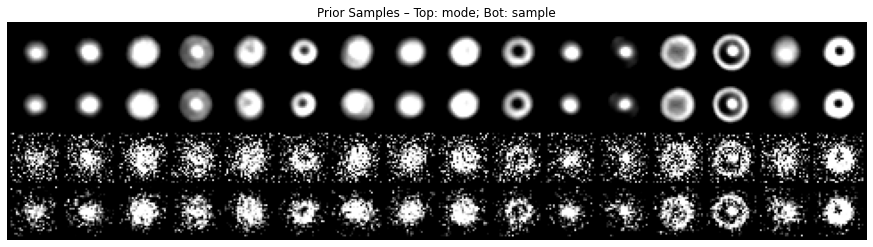

Best val_loss
epoch:  13 - train loss: 1.36173, val_loss: 1.31457, β: 8.9, lr: 0.00030


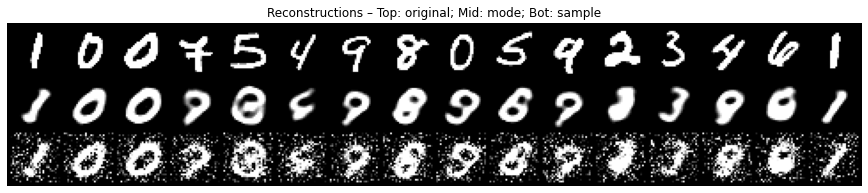

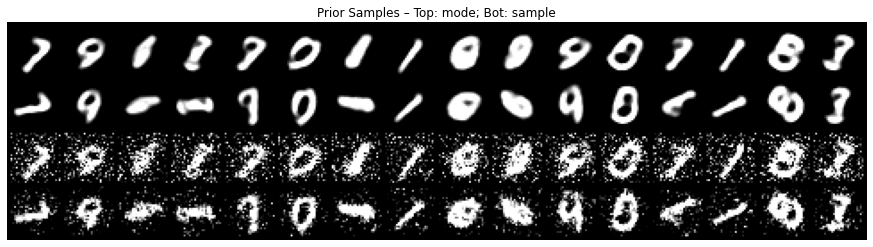

Best val_loss
epoch:  14 - train loss: 1.29755, val_loss: 1.28469, β: 8.7, lr: 0.00029


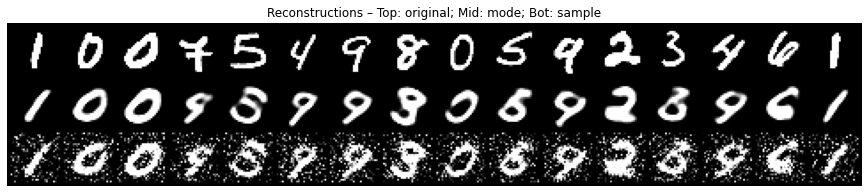

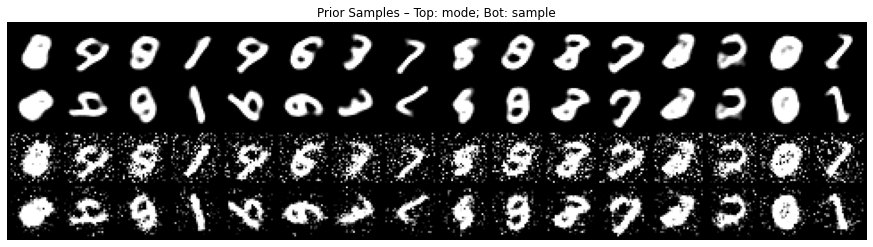

Best val_loss
epoch:  15 - train loss: 1.27247, val_loss: 1.26648, β: 8.6, lr: 0.00029


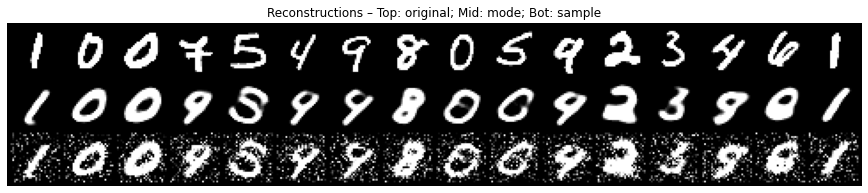

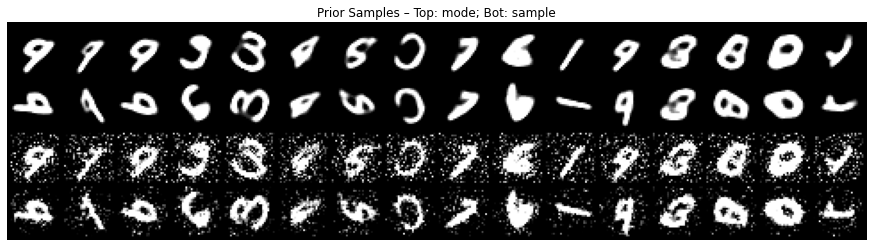

Best val_loss
epoch:  16 - train loss: 1.25840, val_loss: 1.25306, β: 8.4, lr: 0.00029


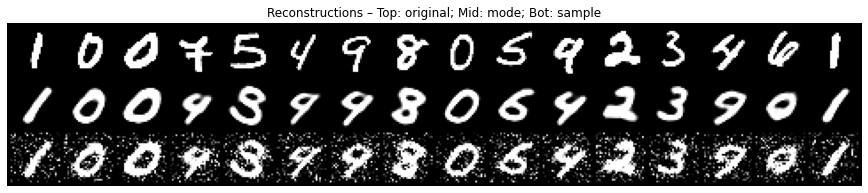

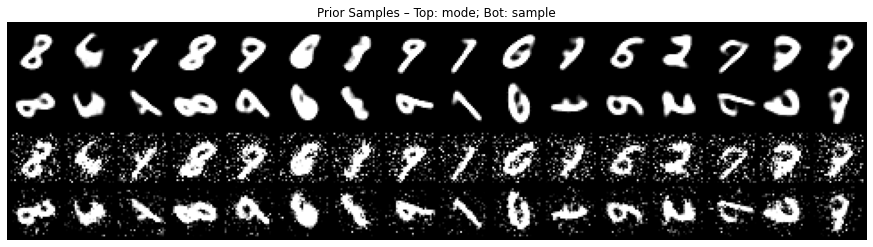

Best val_loss
epoch:  17 - train loss: 1.24712, val_loss: 1.24152, β: 8.2, lr: 0.00028


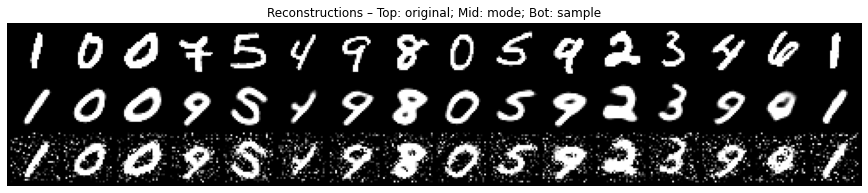

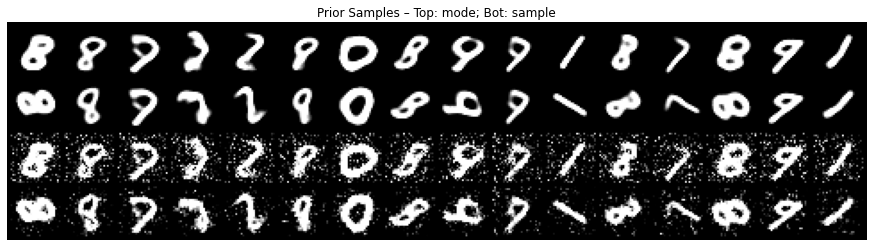

Best val_loss
epoch:  18 - train loss: 1.23755, val_loss: 1.23383, β: 8.0, lr: 0.00027


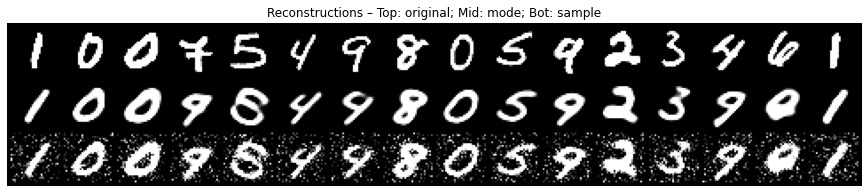

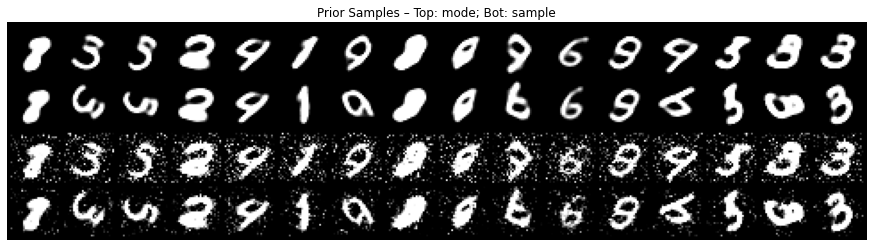

Best val_loss
epoch:  19 - train loss: 1.22802, val_loss: 1.22434, β: 7.8, lr: 0.00027


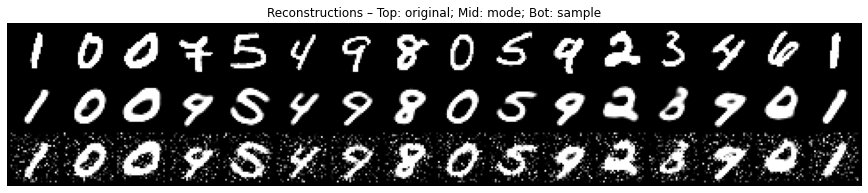

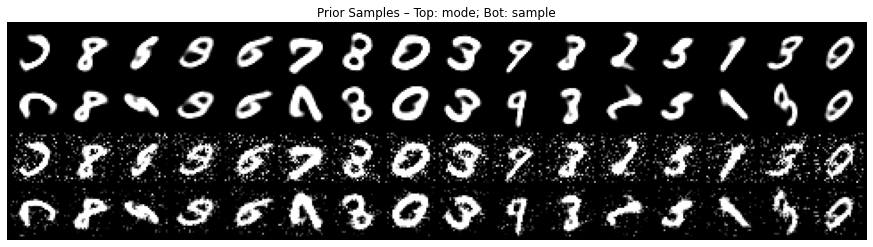

Best val_loss
epoch:  20 - train loss: 1.22070, val_loss: 1.21730, β: 7.6, lr: 0.00026


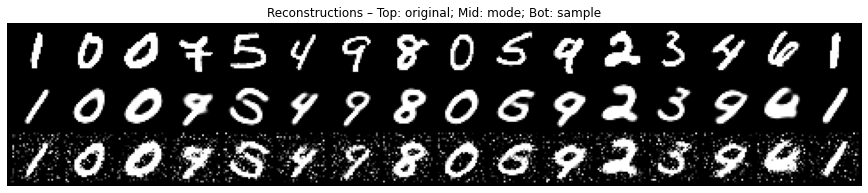

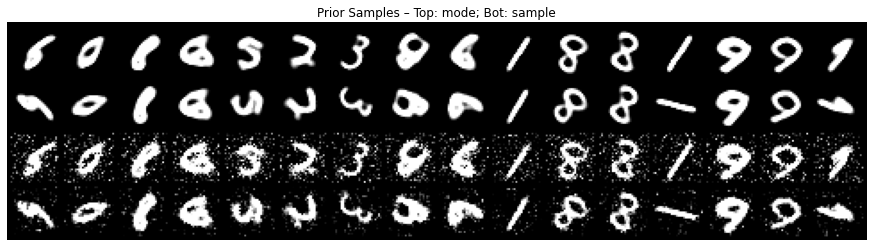

Best val_loss
epoch:  21 - train loss: 1.21320, val_loss: 1.20925, β: 7.4, lr: 0.00025


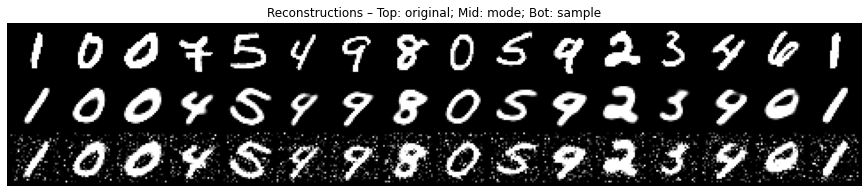

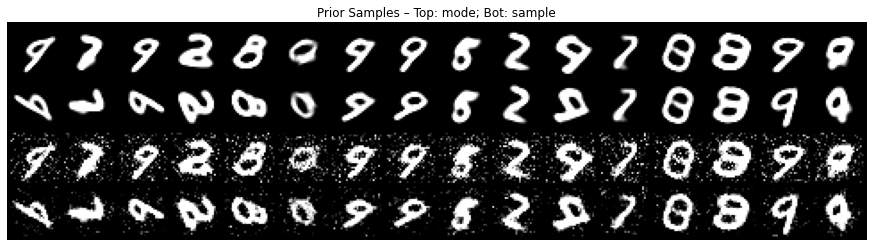

Best val_loss
epoch:  22 - train loss: 1.20593, val_loss: 1.20479, β: 7.2, lr: 0.00025


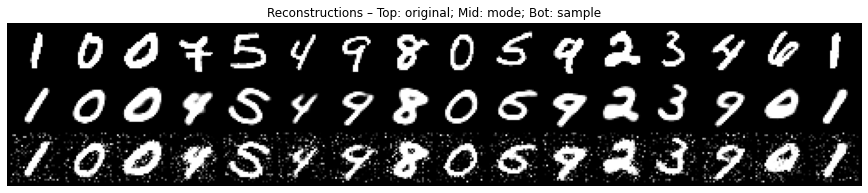

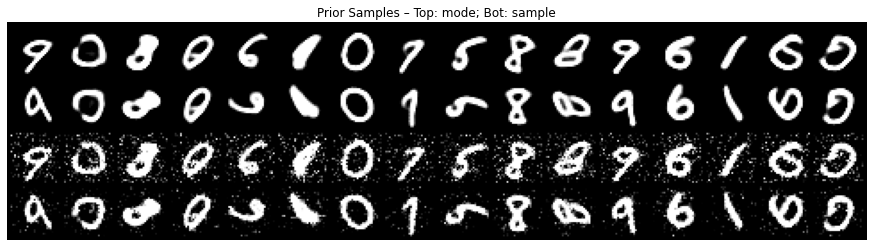

Best val_loss
epoch:  23 - train loss: 1.19915, val_loss: 1.19834, β: 6.9, lr: 0.00024


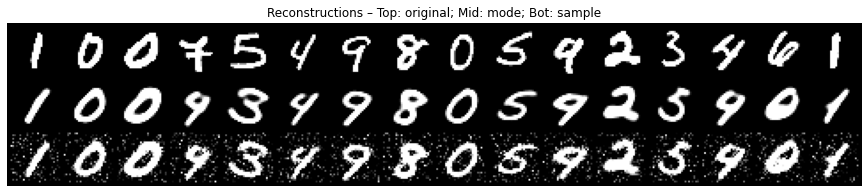

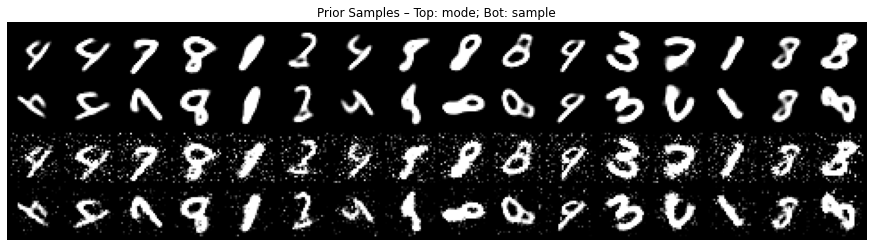

Best val_loss
epoch:  24 - train loss: 1.19271, val_loss: 1.19145, β: 6.7, lr: 0.00023


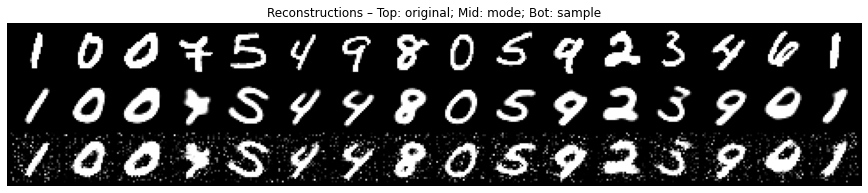

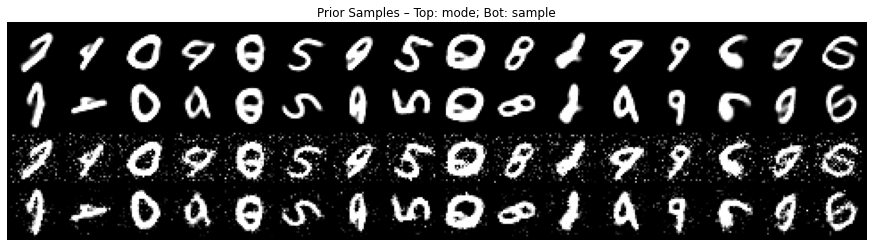

Best val_loss
epoch:  25 - train loss: 1.18670, val_loss: 1.18539, β: 6.5, lr: 0.00022


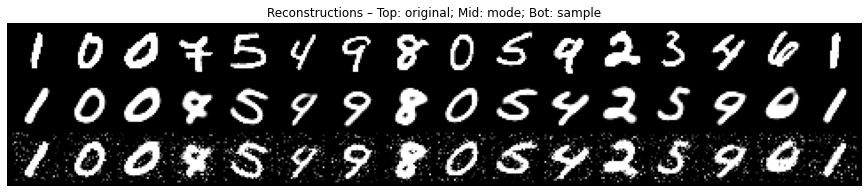

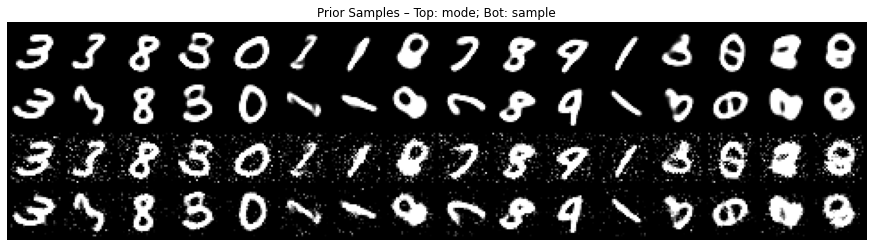

Best val_loss
epoch:  26 - train loss: 1.18067, val_loss: 1.18061, β: 6.3, lr: 0.00021


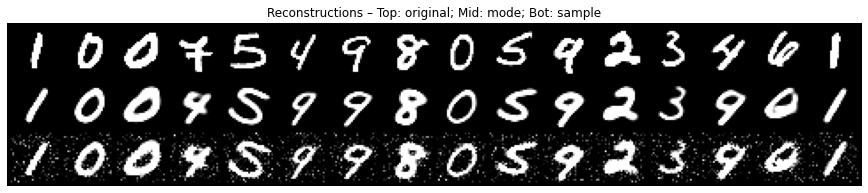

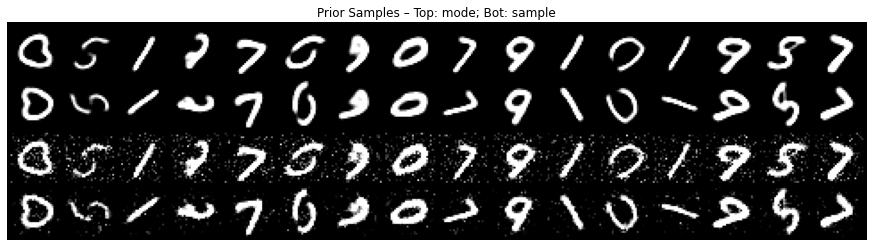

Best val_loss
epoch:  27 - train loss: 1.17509, val_loss: 1.17383, β: 6.1, lr: 0.00020


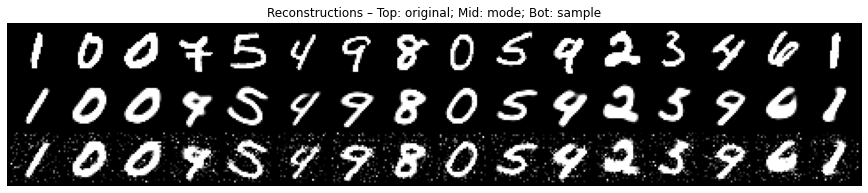

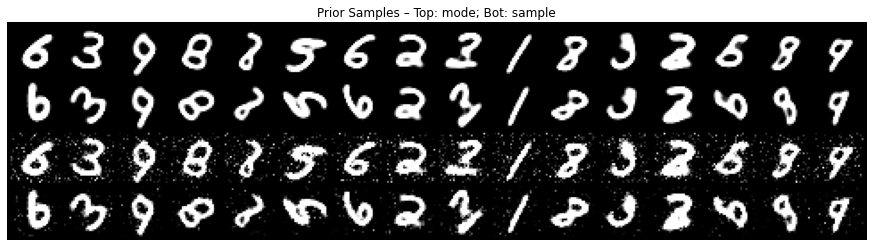

Best val_loss
epoch:  28 - train loss: 1.16923, val_loss: 1.16788, β: 5.8, lr: 0.00019


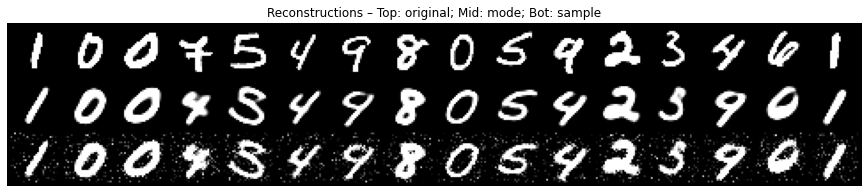

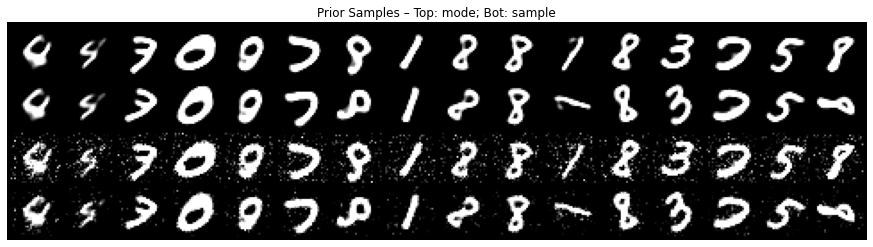

Best val_loss
epoch:  29 - train loss: 1.16407, val_loss: 1.16403, β: 5.6, lr: 0.00018


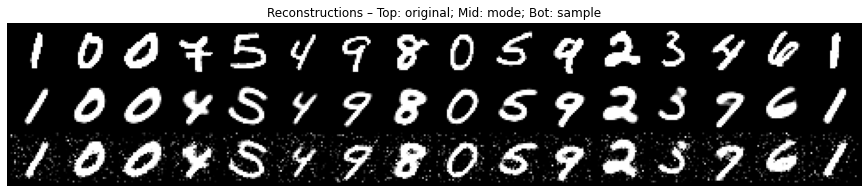

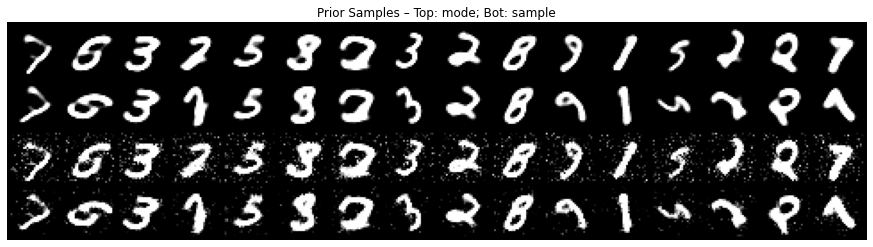

Best val_loss
epoch:  30 - train loss: 1.15862, val_loss: 1.15776, β: 5.4, lr: 0.00017


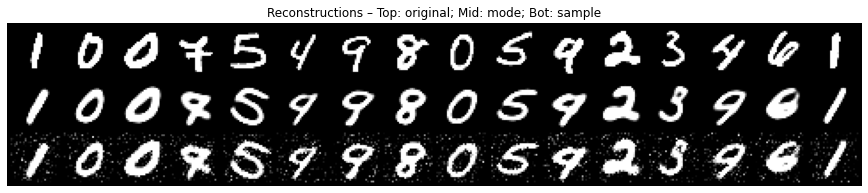

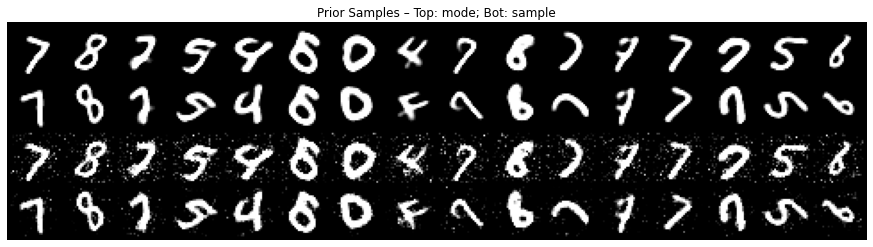

Best val_loss
epoch:  31 - train loss: 1.15362, val_loss: 1.15301, β: 5.2, lr: 0.00016


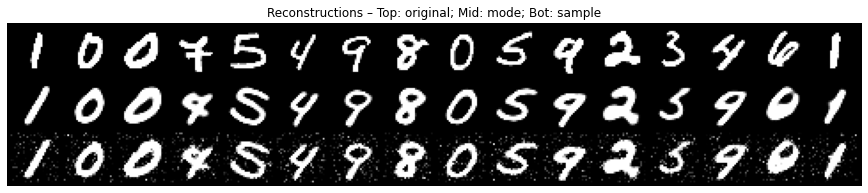

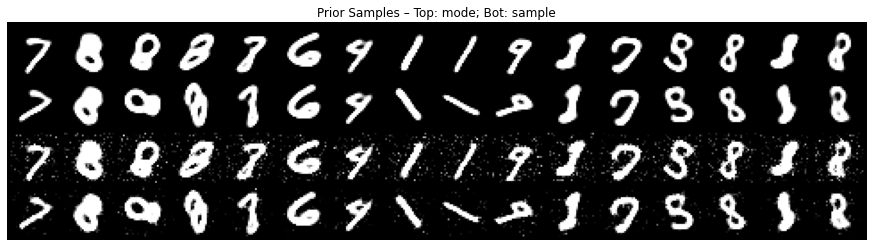

Best val_loss
epoch:  32 - train loss: 1.14878, val_loss: 1.14815, β: 5.0, lr: 0.00015


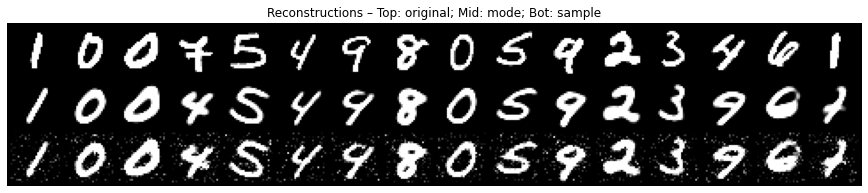

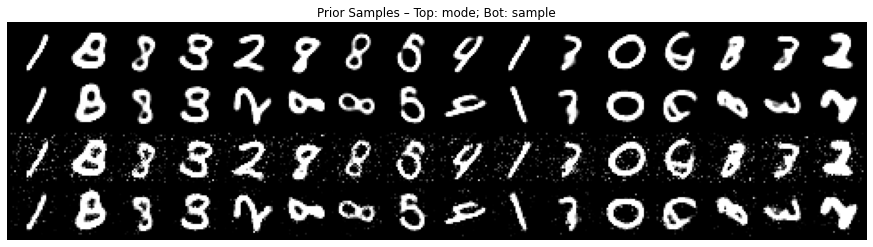

Best val_loss
epoch:  33 - train loss: 1.14387, val_loss: 1.14313, β: 4.8, lr: 0.00014


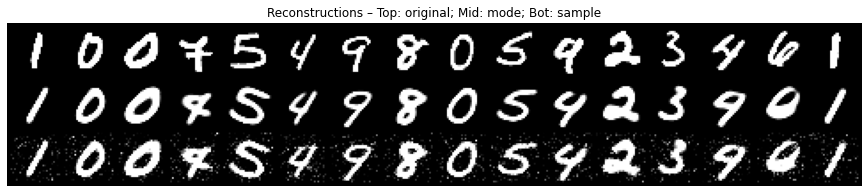

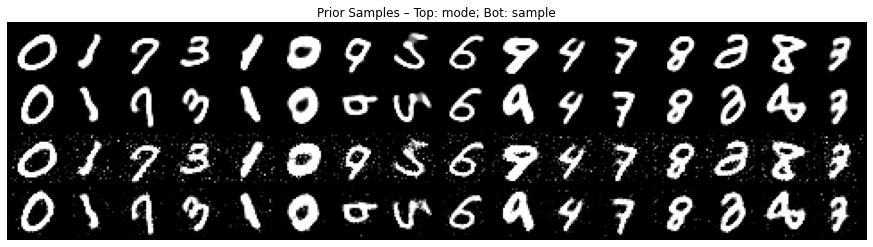

Best val_loss
epoch:  34 - train loss: 1.13912, val_loss: 1.13870, β: 4.6, lr: 0.00013


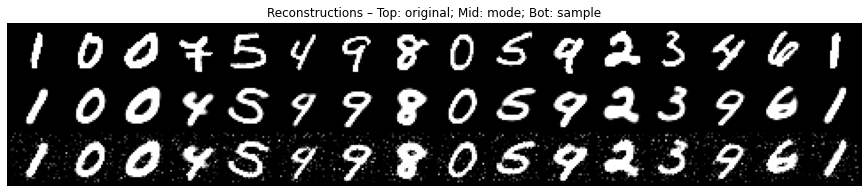

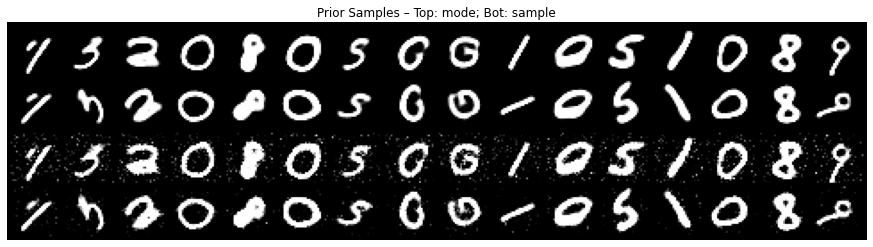

Best val_loss
epoch:  35 - train loss: 1.13473, val_loss: 1.13443, β: 4.4, lr: 0.00012


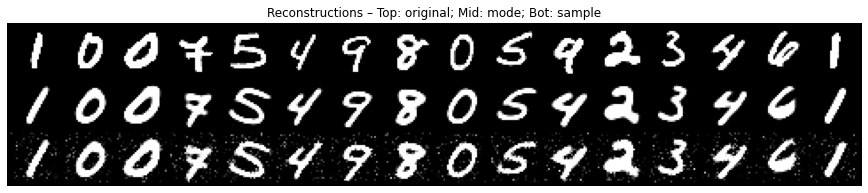

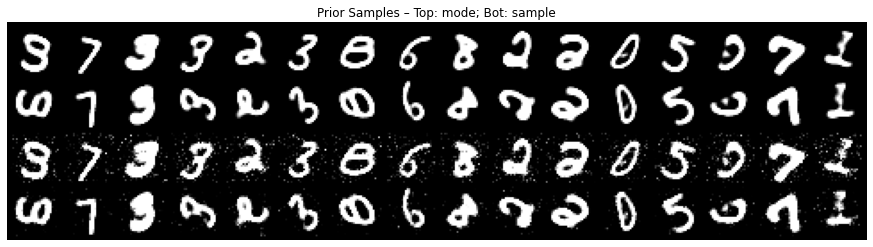

Best val_loss
epoch:  36 - train loss: 1.13046, val_loss: 1.12998, β: 4.3, lr: 0.00011


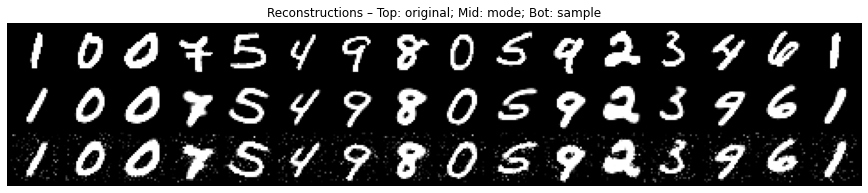

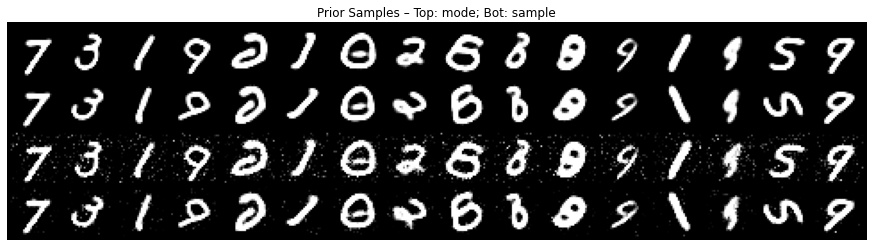

Best val_loss
epoch:  37 - train loss: 1.12611, val_loss: 1.12568, β: 4.1, lr: 0.00010


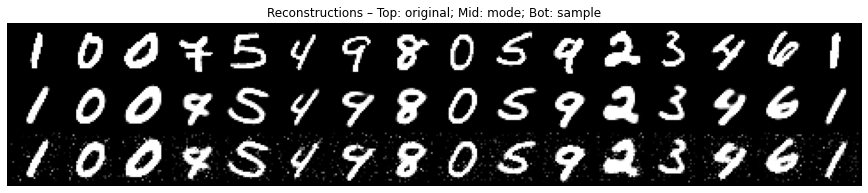

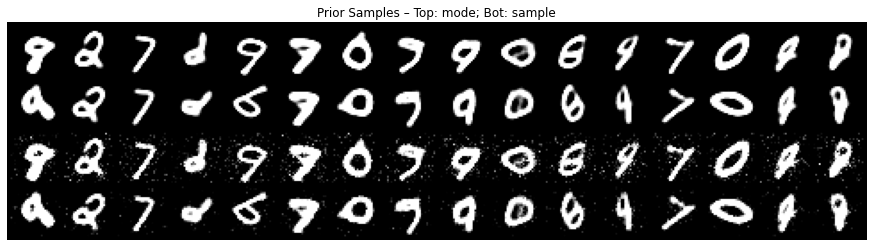

Best val_loss
epoch:  38 - train loss: 1.12218, val_loss: 1.12170, β: 3.9, lr: 0.00009


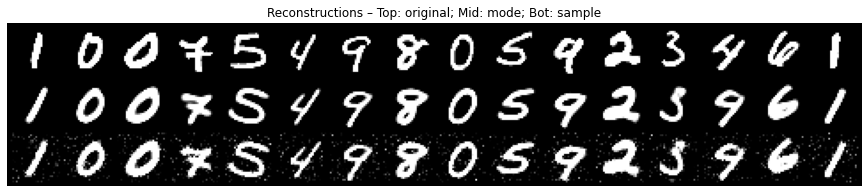

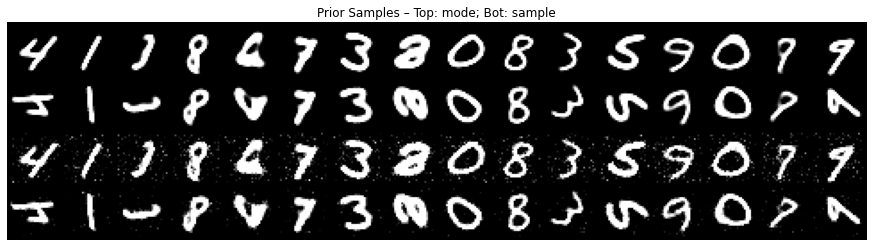

Best val_loss
epoch:  39 - train loss: 1.11850, val_loss: 1.11874, β: 3.8, lr: 0.00008


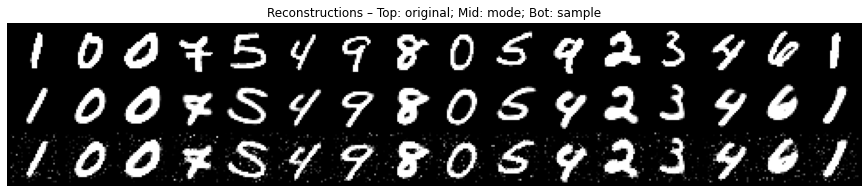

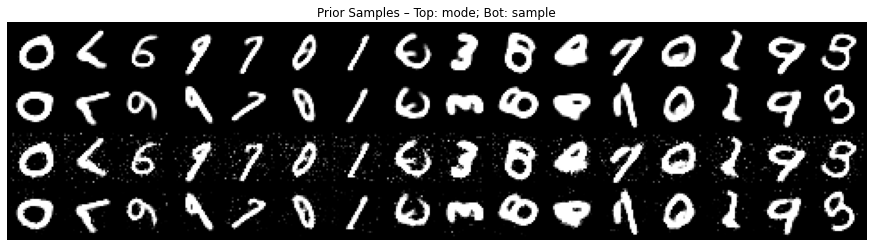

Best val_loss
epoch:  40 - train loss: 1.11500, val_loss: 1.11496, β: 3.7, lr: 0.00007


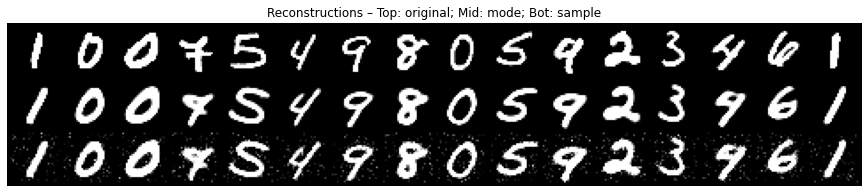

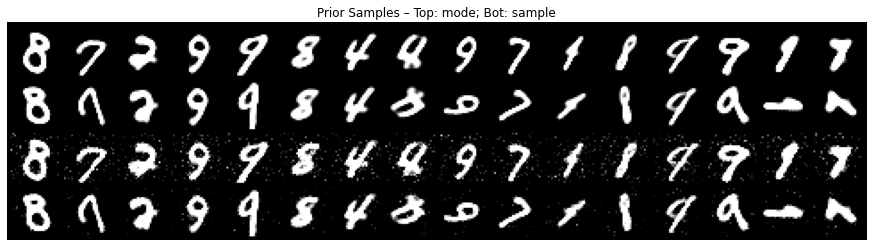

Best val_loss
epoch:  41 - train loss: 1.11164, val_loss: 1.11220, β: 3.5, lr: 0.00007


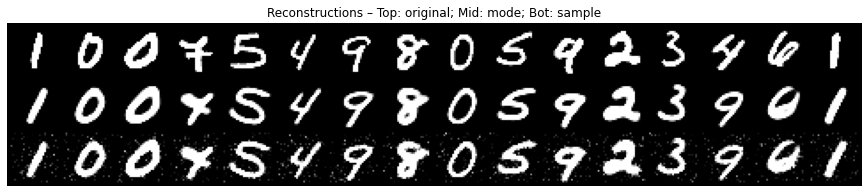

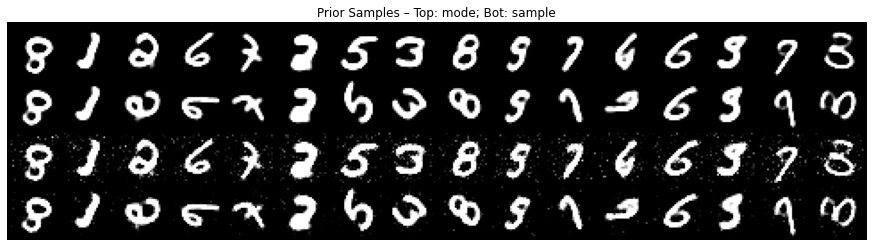

Best val_loss
epoch:  42 - train loss: 1.10870, val_loss: 1.10962, β: 3.4, lr: 0.00006


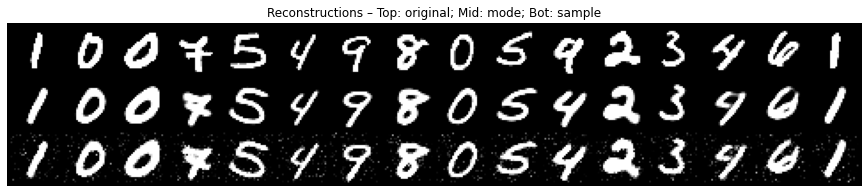

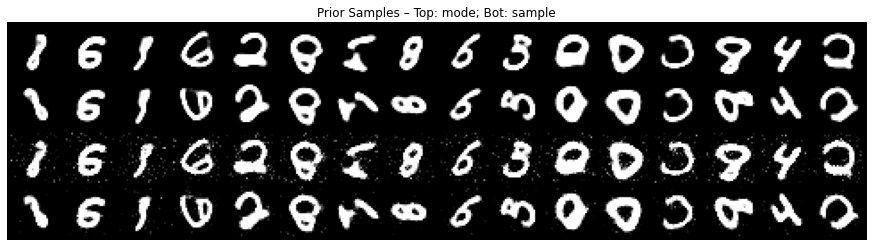

Best val_loss
epoch:  43 - train loss: 1.10597, val_loss: 1.10659, β: 3.3, lr: 0.00005


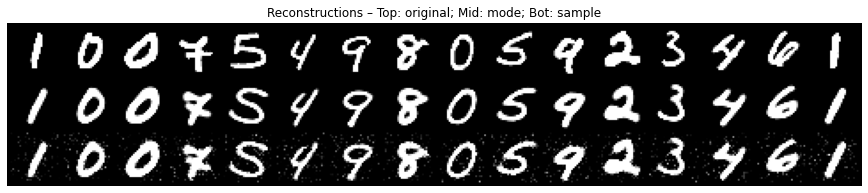

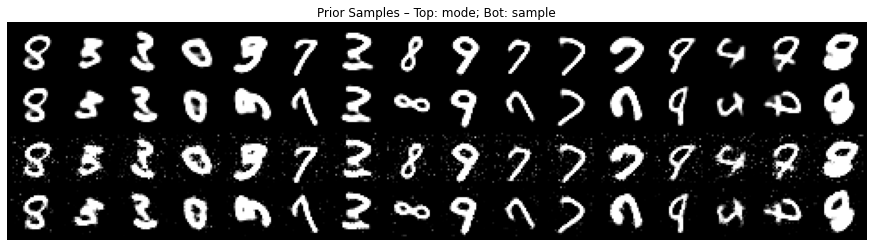

Best val_loss
epoch:  44 - train loss: 1.10344, val_loss: 1.10401, β: 3.2, lr: 0.00005


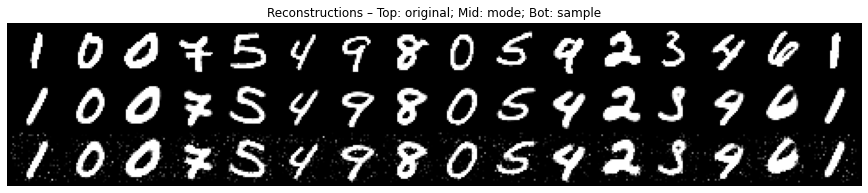

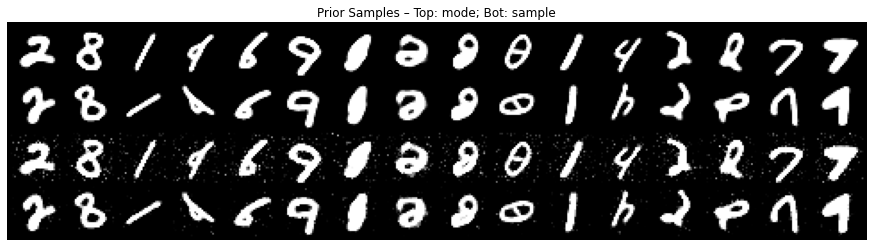

Best val_loss
epoch:  45 - train loss: 1.10134, val_loss: 1.10285, β: 3.2, lr: 0.00004


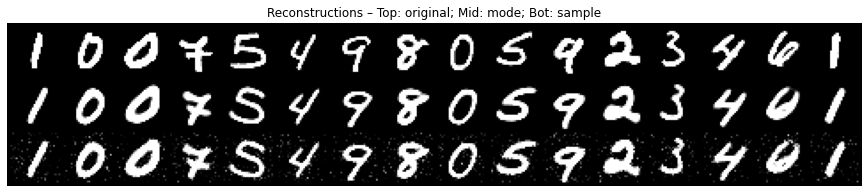

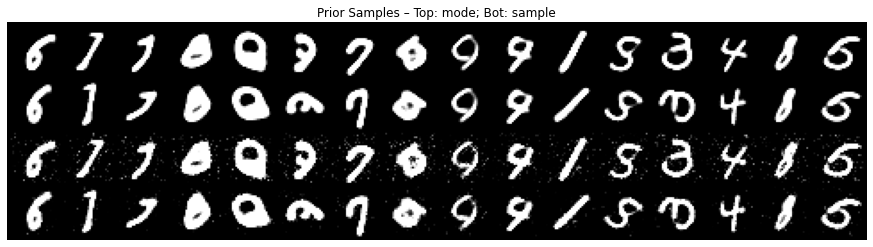

Best val_loss
epoch:  46 - train loss: 1.09934, val_loss: 1.10037, β: 3.1, lr: 0.00004


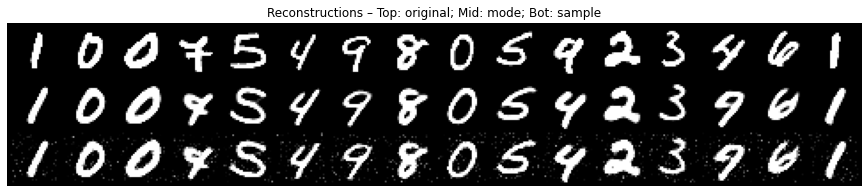

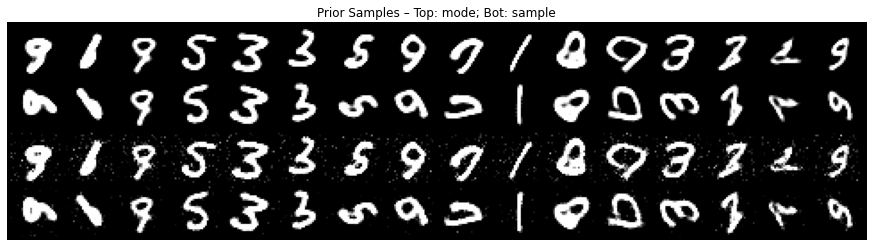

Best val_loss
epoch:  47 - train loss: 1.09763, val_loss: 1.09924, β: 3.1, lr: 0.00004


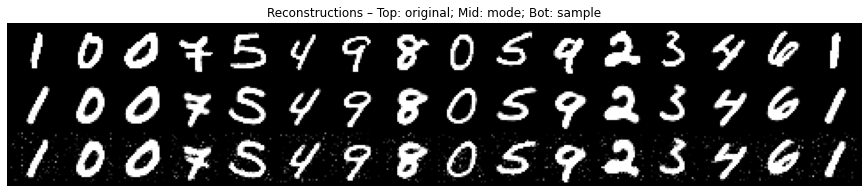

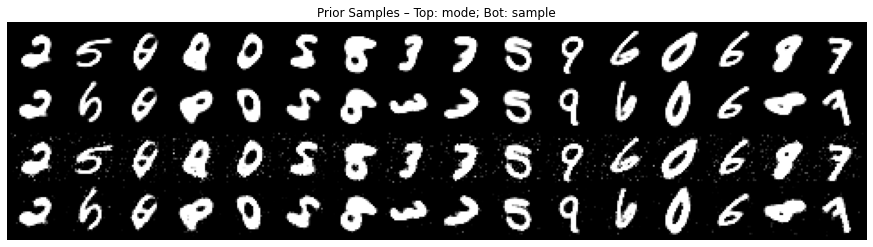

Best val_loss
epoch:  48 - train loss: 1.09641, val_loss: 1.09780, β: 3.0, lr: 0.00003


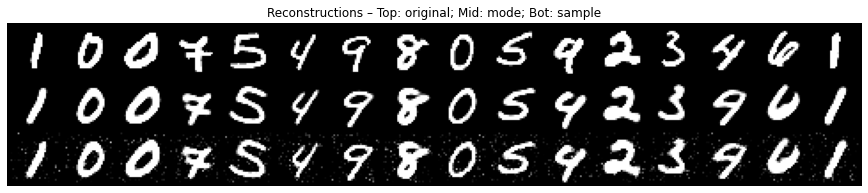

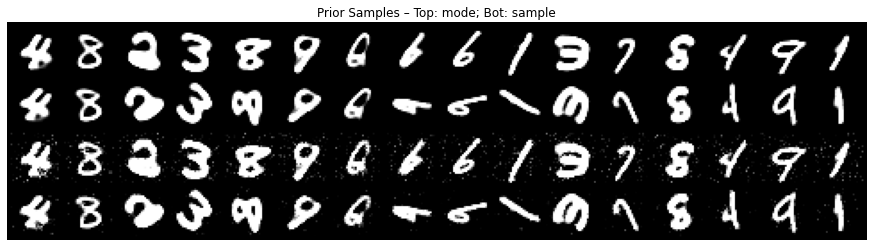

Best val_loss
epoch:  49 - train loss: 1.09538, val_loss: 1.09721, β: 3.0, lr: 0.00003


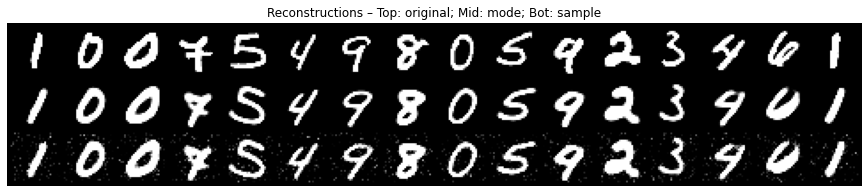

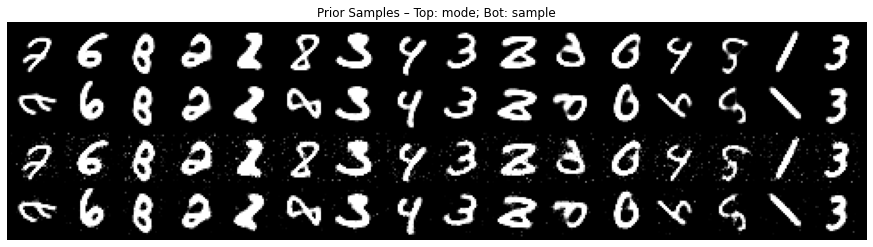

Best val_loss
epoch:  50 - train loss: 1.09470, val_loss: 1.09645, β: 3.0, lr: 0.00003


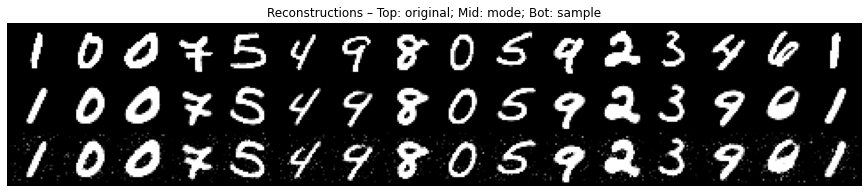

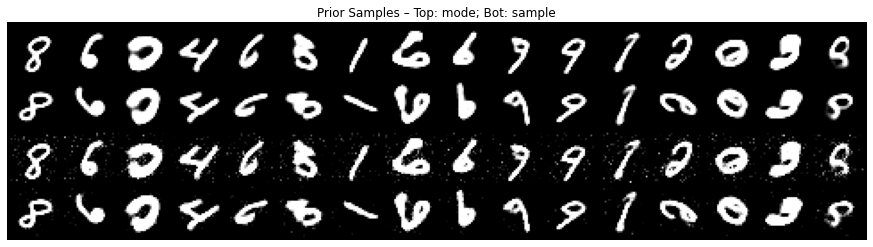

Best val_loss


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
learning_rate,▃▄▄▅▆▆▇▇█████▇▇▇▇▇▆▆▆▅▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁
train/elbo,▁▂▂▂▃▃▃▃▃▄▄▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████
train/elbo_unnorm,▁▂▂▂▃▃▃▃▃▄▄▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████
train/kld,▂▁▁▁▁▁▁▁▁▁▁▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇█████
train/ll,▁▂▂▂▂▂▂▃▃▃▄▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇████████████
train/loss,█▇▇▇▆▆▆▆▆▅▅▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train/η_kld,█▆▇▅▅▃▂▂▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
val/elbo,▁▁▁▂▂▂▂▂▃▃▄▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇███████████
val/elbo_unnorm,▁▁▁▂▂▂▂▂▃▃▄▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇███████████
val/kld,▁▁▁▁▁▁▁▁▁▁▂▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇█████


In [9]:
state = train_loop(
    model, state, config, rng, make_LIVAE_loss, make_LIVAE_eval, train_loader, val_loader,
    # test_loader,
    wandb_kwargs={
        # 'mode': 'offline',
        # 'notes': '',
    },
)

In [10]:
state

TrainState(step=DeviceArray(10550, dtype=int32, weak_type=True), apply_fn=<bound method Module.apply of LIVAE(
    # attributes
    encoder_invariance = 'none'
    invariance_samples = 0
    learn_η_prior = True
)>, params=FrozenDict({
    dec: {
        ConvNeXtBlock_0: {
            dw3x3conv: {
                bias: DeviceArray([ 3.32498294e-03, -1.87171381e-02,  2.70565934e-02,
                              1.87434314e-03,  1.52931956e-03,  2.17062561e-03,
                              3.03822439e-02,  1.61122512e-02, -1.63808055e-02,
                              3.91794322e-03,  8.35659541e-03,  7.25630717e-03,
                              1.64279360e-02, -9.66960751e-03, -7.38638872e-03,
                             -1.64151876e-04, -5.74693941e-02, -4.18433314e-03,
                              3.19688134e-02,  9.74569749e-03, -5.39423479e-03,
                              1.25541613e-02, -8.87341332e-03,  8.57392512e-03,
                             -1.22292507e-02, -6.586703

In [11]:
import jax
jax.nn.softplus(0.04529225)

DeviceArray(0.71604973, dtype=float32, weak_type=True)